<a href="https://colab.research.google.com/github/moham6839/Data_620_Final_Project/blob/main/Final__Project_Data_620_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data 620 Web Analytics

Final Project



Said Naqwe

Eddie Xu

Mohamed Hassan-El Serafi



# Instructions

Your project should incorporate one or both of the two main themes of this course: network analysis and text processing. You need to show all of your work in a coherent workflow, and in a reproducible format, such as an IPython Notebook or an R Markdown document. If you are building a model or models, explain how you evaluate the “goodness” of the chosen model and parameters.

# Introduction

For our analysis, we are building a sentiment analysis model to classify tweets about major airlines (e.g., Virgin America, American) as positive, negative, or neutral, using a dataset of ~3,000 tweets from X. By analyzing tweet text and metadata, we aim to uncover public sentiment trends and explore social influence through network analysis of user-airline interactions. This project demonstrates our skills in text mining, machine learning, and graph analysis.

**Analysis Overview**

**Loading the Dataset:**
Import libraries (Pandas, Scikit-learn, NLTK, NetworkX) and load the X.csv dataset, containing tweets about airlines with pre-labeled sentiments, text, and metadata like retweet counts.  

**Data Preprocessing:**
Clean tweet text by removing URLs, mentions, and stopwords, handle missing values (e.g., negativereason), remove redundant columns (e.g., airline_sentiment_gold), and split data into 75% training and 25% testing sets.  

**Visualizing Sentiment Distribution:**
Create bar plots to count sentiments (positive, negative, neutral) for each airline using Seaborn, highlighting trends like Virgin America’s positive lean.  

**Word Cloud Visualization:**
Generate word clouds for positive and negative tweets to identify frequent terms (e.g., “great” vs. “delay”) using the wordcloud library.  

Analyzing Negative Reasons:
Summarize and visualize reasons for negative sentiments (e.g., Customer Service Issue, Late Flight) with bar plots, based on the negativereason column.  

**Predicting Sentiments: **
Train classifiers (Support Vector Classifier, Random Forest, Naive Bayes) using Scikit-learn pipelines, similar to our SMS project, to predict sentiments from tweet text.  

**Evaluating Model Performance: **
Calculate accuracy, precision, recall, and F1-scores, and display confusion matrix heatmaps to assess model effectiveness.  

**Building Network Graph: **
Construct a directed graph with NetworkX, where nodes are users and airlines, and edges represent retweets, colored by sentiment, to analyze influence patterns.  

**Conclusion: **
Summarize sentiment trends, model performance, and network insights, linking to applications like improving airline customer service, with suggestions for future enhancements.



# Sentiment Analysis

## Exploratory Data Analysis

In [1]:
# import Libraries
import nltk
nltk.download('stopwords')
import sklearn
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import re
import nltk
import random
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

# import network libraries
import networkx as nx
from networkx.algorithms import bipartite
from networkx.drawing.layout import bipartite_layout
from community import community_louvain
import matplotlib.cm as cm
import networkx.algorithms.community as nx_comm

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
random.seed(620)

In [3]:
Tweet = pd.read_csv("https://raw.githubusercontent.com/moham6839/Data_620_Final_Project/refs/heads/main/X.csv")

In [4]:
Tweet.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


In [5]:
Tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      14640 non-null  int64  
 1   airline_sentiment             14640 non-null  object 
 2   airline_sentiment_confidence  14640 non-null  float64
 3   negativereason                9178 non-null   object 
 4   negativereason_confidence     10522 non-null  float64
 5   airline                       14640 non-null  object 
 6   airline_sentiment_gold        40 non-null     object 
 7   name                          14640 non-null  object 
 8   negativereason_gold           32 non-null     object 
 9   retweet_count                 14640 non-null  int64  
 10  text                          14640 non-null  object 
 11  tweet_coord                   1019 non-null   object 
 12  tweet_created                 14640 non-null  object 
 13  t

**Data Preprocessing**

We’ll clean the dataset by identifying and handling null or NA values, such as filling missing negativereason entries with “None” for non-negative tweets. We’ll remove redundant columns like airline_sentiment_gold and tweet_coord to streamline the data. Tweet text will be processed by removing URLs, mentions, punctuation, and stopwords using NLTK, followed by tokenization and conversion to lowercase. We’ll also count the number of positive, negative, and neutral tweets per airline to understand sentiment distribution. Finally, we’ll split the data into 75% training and 25% testing sets for model training



In [6]:
print("Percentage null or na values in df")
((Tweet.isnull() | Tweet.isna()).sum() * 100 / Tweet.index.size).round(2)

Percentage null or na values in df


,0
tweet_id,0.00
airline_sentiment,0.00
airline_sentiment_confidence,0.00
negativereason,37.31
negativereason_confidence,28.13
airline,0.00
airline_sentiment_gold,99.73
name,0.00
negativereason_gold,99.78
retweet_count,0.00


In [7]:
#Removing the following column because of more than 90% having null data
del Tweet['tweet_coord']
del Tweet['airline_sentiment_gold']
del Tweet['negativereason_gold']

In [8]:
#Display Tweet Sentiment
Mood_count=Tweet['airline_sentiment'].value_counts()
print(Mood_count)

airline_sentiment
negative    9178
neutral     3099
positive    2363
Name: count, dtype: int64


## Sentiment of Each Airline

We’ll calculate the total number of tweets for each airline (e.g., Virgin America, American) to understand their mention frequency. Using Seaborn, we’ll create bar plots to visualize the count of positive, negative, and neutral tweets per airline, revealing sentiment trends (e.g., Virgin America’s positive dominance). Additionally, we’ll explore airline-user relationships by constructing a directed network graph with NetworkX, where nodes represent users and airlines, and edges represent retweets, colored by sentiment, to highlight influence patterns



Total number of tweets for each airline 
 airline
United            3822
US Airways        2913
American          2759
Southwest         2420
Delta             2222
Virgin America     504
Name: airline_sentiment, dtype: int64


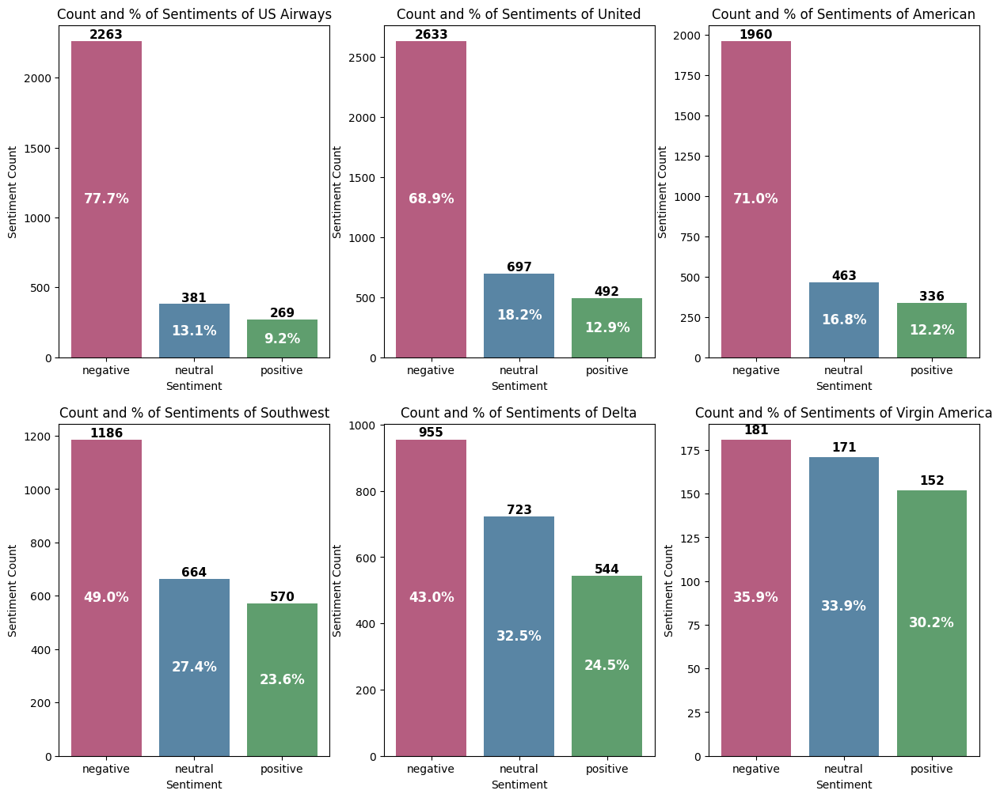

In [9]:
df = Tweet
print("Total number of tweets for each airline \n", df.groupby('airline')['airline_sentiment'].count().sort_values(ascending=False))

airlines = ['US Airways', 'United', 'American', 'Southwest', 'Delta', 'Virgin America']
plt.figure(1, figsize=(15, 12))

for i in airlines:
    index = airlines.index(i)
    plt.subplot(2, 3, index + 1)
    new_df = df[df['airline'] == i]
    count = new_df['airline_sentiment'].value_counts()

    count = count.reindex(['negative', 'neutral', 'positive']).fillna(0).astype(int)
    total = count.sum()
    percentages = (count / total * 100).round(1)

    Index = [1, 2, 3]
    bars = plt.bar(Index, count, color=['#b55d80', '#5985a4', '#5f9e6e'])

    plt.xticks(Index, ['negative', 'neutral', 'positive'])
    plt.ylabel('Sentiment Count')
    plt.xlabel('Sentiment')
    plt.title('Count and % of Sentiments of ' + i)
    for j, bar in enumerate(bars):
        height = bar.get_height()

        # Percentage inside the bar
        plt.text(bar.get_x() + bar.get_width() / 2, height * 0.5,
                 f'{percentages.iloc[j]}%', ha='center', va='center',
                 fontsize=12, color='white', fontweight='bold')

        # Raw count above the bar
        plt.text(bar.get_x() + bar.get_width() / 2, height + 2,
                 f'{count.iloc[j]}', ha='center', va='bottom',
                 fontsize=11, fontweight='bold', color='black')


## Reasons for Negative Sentiment

We’ll analyze the negativereason column in our dataset to identify the primary causes of negative sentiments in customer tweets about airlines. By counting and visualizing the frequency of reasons (e.g., Customer Service Issue, Late Flight) using bar plots with Seaborn, we’ll extract insights into common issues, such as frequent complaints about delays or poor service, to inform airline improvements.



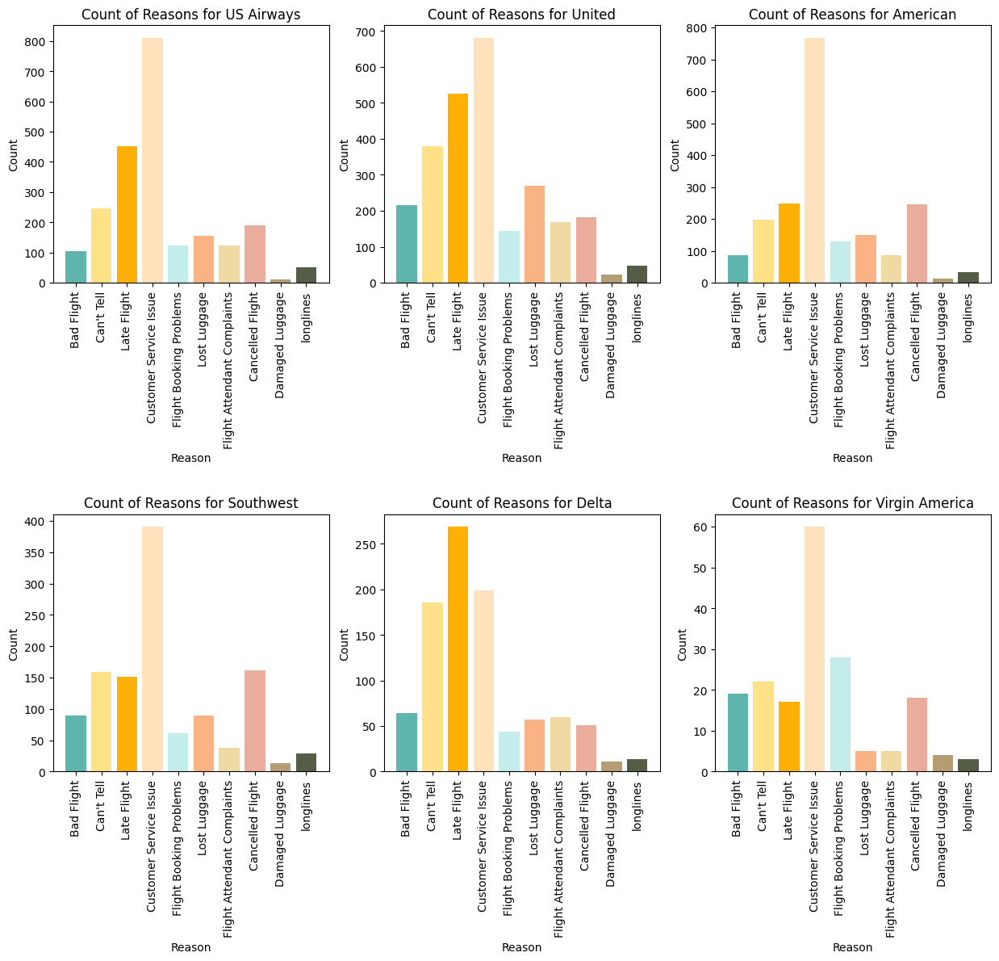

In [10]:
#get the number of negative reasons
df['negativereason'].nunique()

NR_Count=dict(df['negativereason'].value_counts(sort=False))
def NR_Count(Airline):
    if Airline=='All':
        a=df
    else:
        a=df[df['airline']==Airline]
    count=dict(a['negativereason'].value_counts())
    Unique_reason=list(df['negativereason'].unique())
    Unique_reason=[x for x in Unique_reason if str(x) != 'nan']
    Reason_frame=pd.DataFrame({'Reasons':Unique_reason})
    Reason_frame['count']=Reason_frame['Reasons'].apply(lambda x: count[x])
    return Reason_frame
def plot_reason(Airline):

    a=NR_Count(Airline)
    count=a['count']
    Index = range(1,(len(a)+1))
    plt.bar(Index,count, color=['#60b4ae','#ffe288','#ffb007','#ffe1bc','#c3edea','#f9b384','#f0daa4','#eaac9d','#b49c73','#565d47'])
    plt.xticks(Index,a['Reasons'],rotation=90)
    plt.ylabel('Count')
    plt.xlabel('Reason')
    plt.title('Count of Reasons for '+Airline)

plt.figure(2,figsize=(15, 12))
for i in airlines:
    indices= airlines.index(i)
    plt.subplot(2,3,indices+1)
    plt.subplots_adjust(hspace=0.9)
    plot_reason(i)

## Negative Tweets


We’ll use a word cloud to visualize the most frequent words in negative tweets about airlines, leveraging the wordcloud library. In the word cloud, larger words indicate higher frequency in the text, helping us identify common issues like “delay” or “service” that drive customer dissatisfaction. This visualization provides clear insights into the key themes behind negative sentiments, complementing our analysis of airline performance.



In [11]:
from wordcloud import WordCloud,STOPWORDS

In [12]:
df=Tweet[Tweet['airline_sentiment']=='negative']
words = ' '.join(df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and not word.startswith('&')
                                and not word.startswith('wa')
                                and not word.startswith('now')
                                and word != 'RT'
                            ])

In [13]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='white',contour_width=1, contour_color='steelblue',
                      width=4000,
                      height=2500
                     ).generate(cleaned_word)

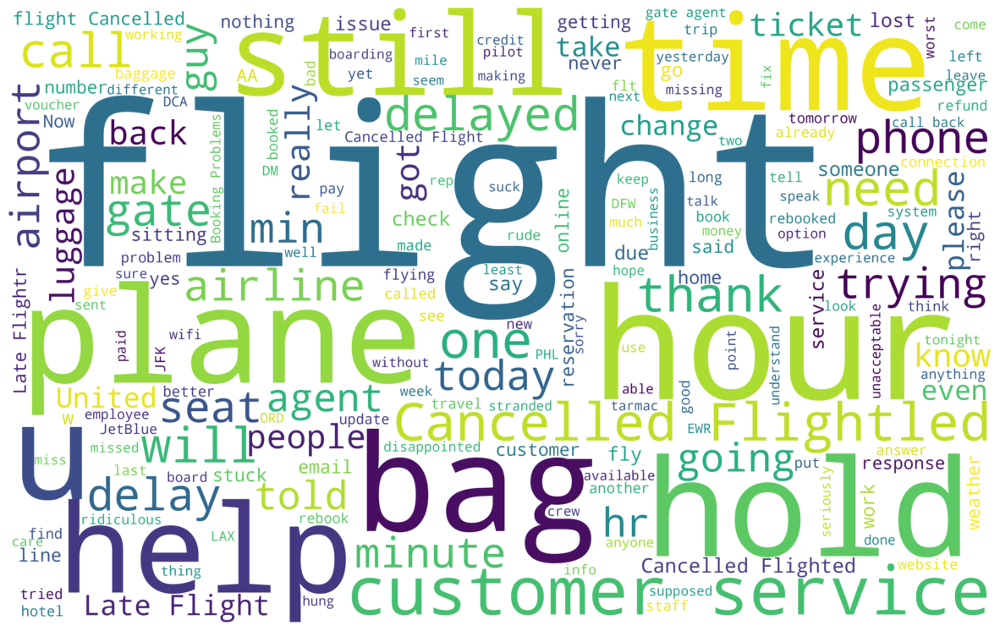

In [14]:
plt.figure(1,figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Positive Tweets

In [15]:
df=Tweet[Tweet['airline_sentiment']=='positive']
words = ' '.join(df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and not word.startswith('&')
                                and word != 'RT'
                            ])

In [16]:
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='white',contour_width=1, contour_color='steelblue',
                      width=4000,
                      height=2500
                     ).generate(cleaned_word)

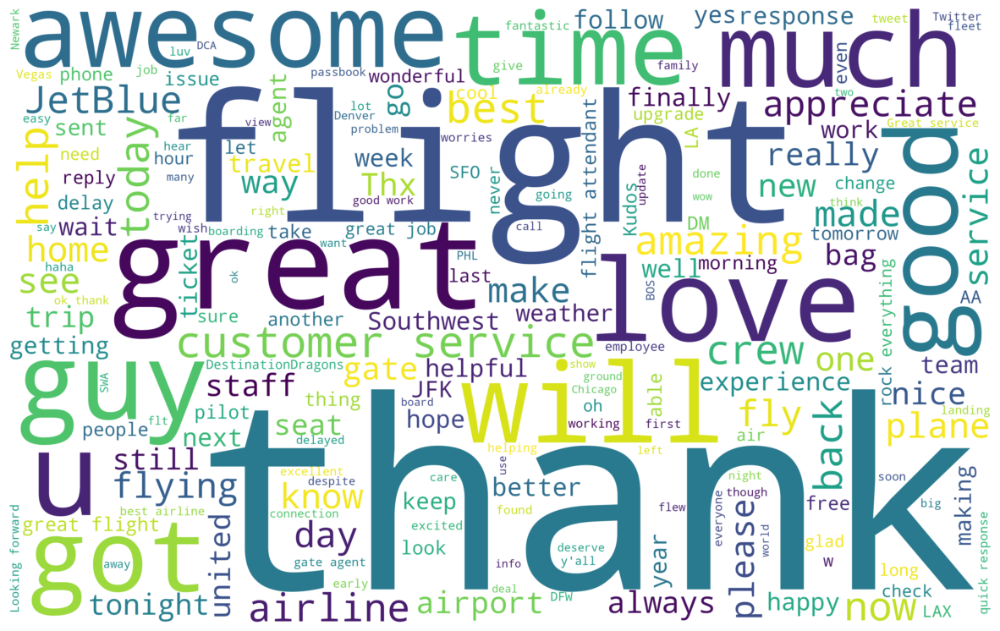

In [17]:
plt.figure(1,figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Data Exploration - Model Classifier

We’ll preprocess the tweet text data to optimize the learning process for our classifier models, ensuring accurate sentiment predictions. This involves cleaning the text by removing URLs, mentions, punctuation, and stopwords, tokenizing words, and converting to lowercase using NLTK. We’ll then apply classification algorithms—Support Vector Classifier, Random Forest, and Naive Bayes—via Scikit-learn pipelines to predict tweet sentiments (positive, negative, neutral), leveraging the cleaned text for robust performance.



In [18]:
def tweet_to_words(raw_tweet):
    letters_only = re.sub("[^a-zA-Z]", " ",raw_tweet)
    words = letters_only.lower().split()
    stops = set(stopwords.words("english"))
    meaningful_words = [w for w in words if not w in stops]
    return( " ".join( meaningful_words ))

In [19]:
def clean_tweet_length(raw_tweet):
    letters_only = re.sub("[^a-zA-Z]", " ",raw_tweet)
    words = letters_only.lower().split()
    stops = set(stopwords.words("english"))
    meaningful_words = [w for w in words if not w in stops]
    return(len(meaningful_words))

In [20]:
Tweet['sentiment']=Tweet['airline_sentiment'].apply(lambda x: 0 if x=='negative' else 1)

In [21]:
random.seed(620)
Tweet['clean_tweet']=Tweet['text'].apply(lambda x: tweet_to_words(x))
Tweet['Tweet_length']=Tweet['text'].apply(lambda x: clean_tweet_length(x))
train,test = train_test_split(Tweet,test_size=0.2,random_state=42)

In [22]:
random.seed(620)
train_clean_tweet=[]
for tweet in train['clean_tweet']:
    train_clean_tweet.append(tweet)
test_clean_tweet=[]
for tweet in test['clean_tweet']:
    test_clean_tweet.append(tweet)

## Predicting Sentiments from Tweet Text Data

We’ll predict tweet sentiments (positive, negative, neutral) using the preprocessed text data from our airline tweets. We’ll apply the following classifier models through Scikit-learn pipelines: Logistic Regression, KNeighborsClassifier, Support Vector Classifier (SVC), DecisionTreeClassifier, RandomForestClassifier, AdaBoostClassifier, and Gaussian Naive Bayes. These models will leverage the cleaned tweet text to classify sentiments accurately, enabling us to compare their performance and identify the best approach for airline sentiment analysis.



In [23]:
random.seed(620)
from sklearn.feature_extraction.text import CountVectorizer
v = CountVectorizer(analyzer = "word")
train_features= v.fit_transform(train_clean_tweet)
test_features=v.transform(test_clean_tweet)

In [24]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.metrics import accuracy_score

In [25]:
random.seed(620)
Classifiers = [
    LogisticRegression(C=0.000000001,solver='liblinear',max_iter=200),
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True,gamma='auto'),
    DecisionTreeClassifier(),
    RandomForestClassifier(n_estimators=200),
    AdaBoostClassifier(),
    GaussianNB()]

In [26]:
random.seed(620)
dense_features=train_features.toarray()
dense_test= test_features.toarray()
Accuracy=[]
Model=[]
for classifier in Classifiers:
    try:
        fit = classifier.fit(train_features,train['sentiment'])
        pred = fit.predict(test_features)
    except Exception:
        fit = classifier.fit(dense_features,train['sentiment'])
        pred = fit.predict(dense_test)
    accuracy = accuracy_score(pred,test['sentiment'])
    Accuracy.append(accuracy)
    Model.append(classifier.__class__.__name__)
    print('Accuracy of '+classifier.__class__.__name__+' is '+str(accuracy))

Accuracy of LogisticRegression is 0.6451502732240437
Accuracy of KNeighborsClassifier is 0.5812841530054644
Accuracy of SVC is 0.6451502732240437
Accuracy of DecisionTreeClassifier is 0.7544398907103825
Accuracy of RandomForestClassifier is 0.8114754098360656
Accuracy of AdaBoostClassifier is 0.73224043715847
Accuracy of GaussianNB is 0.5724043715846995


## Compare the Model Performances

We’ll evaluate the performance of our classifier models—Logistic Regression, KNeighborsClassifier, SVC, DecisionTreeClassifier, RandomForestClassifier, AdaBoostClassifier, and Gaussian Naive Bayes—in predicting tweet sentiments. Using Scikit-learn, we’ll compute accuracy, precision, recall, and F1-scores for each model and visualize their effectiveness with confusion matrix heatmaps. By comparing these metrics, we’ll identify the best-performing model for airline sentiment analysis, providing insights into which approach best captures customer sentiment trends.



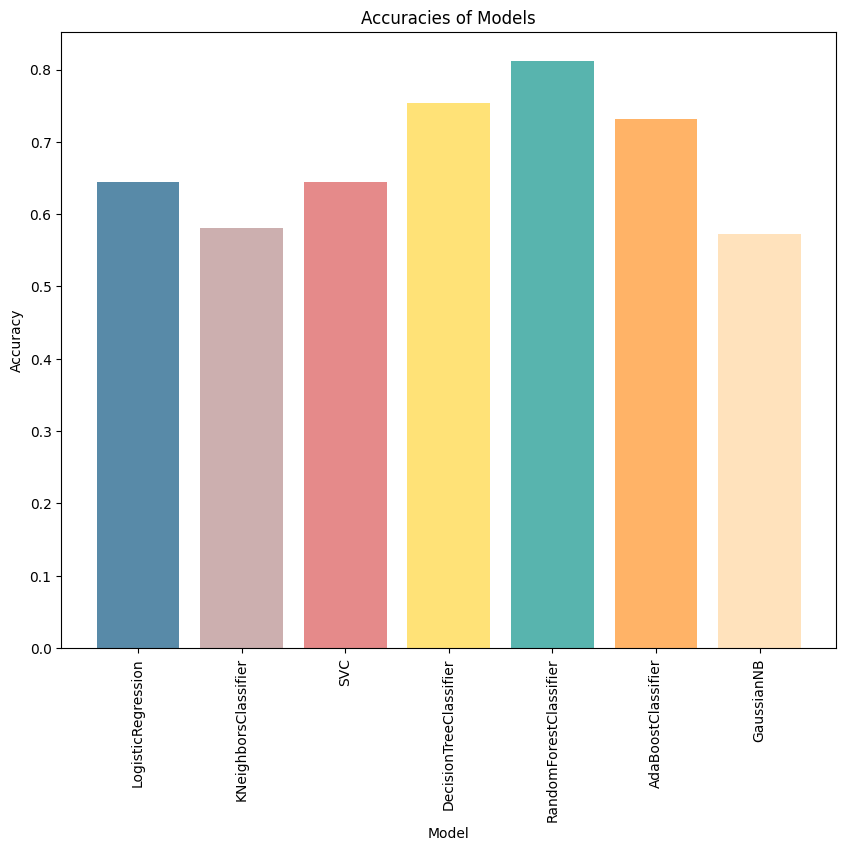

In [27]:
Index = [1,2,3,4,5,6,7]
plt.figure(5,figsize=(10, 8))
plt.bar(Index,Accuracy,color=['#588aa8', '#ccafaf', '#e58a8a','#ffe277', '#58b4ae', '#ffb367', '#ffe2bc'])
plt.xticks(Index, Model,rotation=90)
plt.ylabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracies of Models');

In [28]:
random.seed(620)
# Choosing Top Three Performing Models
from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
Classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(n_estimators=200),
    AdaBoostClassifier()]

Random Forest Classifier gives us the best accuracy score, precision scores according to the classification report.

## Confusion Matrix

In [29]:
random.seed(620)
dense_features=train_features.toarray()
dense_test= test_features.toarray()
Accuracy=[]
Model=[]
for classifier in Classifiers:
    try:
        fit = classifier.fit(train_features,train['airline_sentiment'])
        pred = fit.predict(test_features)
    except Exception:
        fit = classifier.fit(dense_features,train['airline_sentiment'])
        pred = fit.predict(dense_test)
    accuracy = accuracy_score(pred,test['airline_sentiment'])
    Accuracy.append(accuracy)
    Model.append(classifier.__class__.__name__)
    print('Accuracy of '+classifier.__class__.__name__+' is '+str(accuracy))
    print(classification_report(pred,test['airline_sentiment']))
    cf_matrix=confusion_matrix(pred , test['airline_sentiment'])
    #sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')

Accuracy of DecisionTreeClassifier is 0.694672131147541
              precision    recall  f1-score   support

    negative       0.80      0.81      0.80      1864
     neutral       0.47      0.43      0.45       626
    positive       0.56      0.59      0.58       438

    accuracy                           0.69      2928
   macro avg       0.61      0.61      0.61      2928
weighted avg       0.69      0.69      0.69      2928

Accuracy of RandomForestClassifier is 0.7701502732240437
              precision    recall  f1-score   support

    negative       0.91      0.82      0.86      2106
     neutral       0.45      0.58      0.51       449
    positive       0.60      0.73      0.66       373

    accuracy                           0.77      2928
   macro avg       0.65      0.71      0.68      2928
weighted avg       0.80      0.77      0.78      2928

Accuracy of AdaBoostClassifier is 0.6816939890710383
              precision    recall  f1-score   support

    negative     

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Observations & Analysis

Overall, Twitter users did not have positive sentiments for each airline. 63% of users had a negative airline sentiment, 21% expresssed a positive sentiment, and 16% had a neutral sentiment. When looking at airline sentiments for each airline, negative sentiments outnumbered the other sentiments. 26% of Twitter users expressed sentiments towards United Airways, which was the most among all airlines, while only 3% expressed reactions towards Virgin America. Southwest had the most users that expressed a positive sentiment with 570, followed by Delta with 544. Conversely, United and US Airways had the most users that expressed a negative sentiment, with United having 2,633 negative sentiments and US Airways having 2,263 negative sentiments.

We wanted to dig deeper and analyze the reasons behind the negative sentiments. Using the negativereasons column, we counted the negative reasons that Twitter users had for each airline. With the exception of Delta, the predominant reason users had for their negative sentiment for each airline was Customer Service Issue. For Delta, Late Flight was the most expressed negative reason among users.

Finally, we created multiple models to predict tweet sentiments. We binary-coded the sentiments, with negative sentiment set to 0 and positive/neutral sentiments set to 1. The classifier models we used were Logistic Regression, K-Nearest Neighbors, Support Vector Machine, Random Forest, Decision Tree, Ada Boost. The three models that had the highest accuracy were Random Forest at 81%, Decision Tree at 76% and Ada Boost at 73%. We applied the three models to the original airline_sentiment column. Random Forest produced the highest accuracy at 77%, followed by Decision Tree at 69% and Ada Boost at 68%. Random Forest also produced the highest f1-score when predicting positive sentiments, with a score of 66%. Decision Tree had the second-highest f1-score for predicting positive sentiments with 58%, followed by Ada Boost at 40%.

# Bipartite Network Analysis

For our network analysis, we focused on one of the negative reasons Twitter users gave for the airlines. "Late flight" is a common complaint customers have, and therefore we focused on this particular reason. Once that was established, we created a bipartite focused on airlines and Twitter user names, evaulating the centrality measures of users and their influence to other users who expressed "Late Flight" as their negative reason.

In [30]:
random.seed(620)
# extract long tweets based on late flight
# tweet_clean = Tweet.dropna(subset = 'tweet_location')
# tweet_clean = tweet_clean.dropna(subset='user_timezone')
# late_flight = pd.DataFrame(tweet_clean[(tweet_clean['negativereason'] == 'Late Flight') & (tweet_clean['negativereason_confidence'] == 1)])
late_flight = Tweet[Tweet['negativereason'] == 'Late Flight']

print(len(late_flight))

1665


In [31]:
late_flight.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,name,retweet_count,text,tweet_created,tweet_location,user_timezone,sentiment,clean_tweet,Tweet_length
15,570282469121007616,negative,0.6842,Late Flight,0.3684,Virgin America,smartwatermelon,0,@VirginAmerica SFO-PDX schedule is still MIA.,2015-02-24 10:01:50 -0800,"palo alto, ca",Pacific Time (US & Canada),0,virginamerica sfo pdx schedule still mia,6
67,569973821396152323,negative,1.0000,Late Flight,0.6789,Virgin America,noelduan,0,"@VirginAmerica Hi, Virgin! I'm on hold for 40-...",2015-02-23 13:35:23 -0800,SF ↔ NY,Eastern Time (US & Canada),0,virginamerica hi virgin hold minutes earlier f...,12
82,569933405506310144,negative,0.6792,Late Flight,0.3477,Virgin America,arieldaie,0,@VirginAmerica you're the best!! Whenever I (b...,2015-02-23 10:54:47 -0800,Los Angeles,NaN,0,virginamerica best whenever begrudgingly use a...,9
93,569911674158731264,negative,1.0000,Late Flight,1.0000,Virgin America,GunsNDip,0,"@VirginAmerica just landed in LAX, an hour aft...",2015-02-23 09:28:26 -0800,NaN,Pacific Time (US & Canada),0,virginamerica landed lax hour late flight bag ...,12
101,569892199690678272,negative,1.0000,Late Flight,0.6882,Virgin America,GunsNDip,0,@VirginAmerica why must a traveler miss a flig...,2015-02-23 08:11:03 -0800,NaN,Pacific Time (US & Canada),0,virginamerica must traveler miss flight late f...,16


In [32]:
# Create two node lists (users and airlines)
airline_node = pd.DataFrame(late_flight['airline'])
airline_node = airline_node.rename(columns={'airline': 'node'})
airline_node['type'] = 'airline'
airline_list = list(set(airline_node['node']))
print(airline_list)

['US Airways', 'Delta', 'Southwest', 'American', 'United', 'Virgin America']


In [33]:
user_node = pd.DataFrame(late_flight['name'])
user_node = user_node.rename(columns={'name': 'node'})
user_node['type'] = 'name'
user_list = list(set(user_node['node']))
print(len(user_list))

1246


In [34]:
# create edge list between the users and airline
edge_full = late_flight[['airline','name']]

edge_list = list(zip(edge_full['airline'], edge_full['name']))
print(edge_list)

[('Virgin America', 'smartwatermelon'), ('Virgin America', 'noelduan'), ('Virgin America', 'arieldaie'), ('Virgin America', 'GunsNDip'), ('Virgin America', 'GunsNDip'), ('Virgin America', 'mrmichaellay'), ('Virgin America', 'GunsNDip'), ('Virgin America', 'nicholas_v'), ('Virgin America', 'MOCBlogger'), ('Virgin America', 'jarrydosborne'), ('Virgin America', 'finslippy'), ('Virgin America', 'wmrrock'), ('Virgin America', 'stephenasilverm'), ('Virgin America', 'bonniecamp'), ('Virgin America', 'LondonBrushCo'), ('Virgin America', 'lindsowesto'), ('Virgin America', 'jonovoss'), ('United', 'lsalazarll'), ('United', 'BocheBillions'), ('United', 'kevinfla3'), ('United', 'cristobalwong'), ('United', 'fuchsialipstick'), ('United', 'guichaves1989'), ('United', 'RaquelSnyderDC'), ('United', 'PFlandersdc'), ('United', 'Twist_OP'), ('United', 'Twist_OP'), ('United', 'etiyi'), ('United', 'xRaeCatherine'), ('United', 'Sri_Philips'), ('United', 'bcarlsrud'), ('United', 'dkesten71'), ('United', 'Twis

In [35]:
# create the bipartite graph
airline_bipart = nx.Graph()

# add nodes and edges
airline_bipart.add_nodes_from(airline_list, bipartite=0)
airline_bipart.add_nodes_from(user_list, bipartite=1)
airline_bipart.add_edges_from(edge_list)

# check if the graph is bipartite
print(bipartite.is_bipartite(airline_bipart))

bipartite_none = list()
# Examine the bipartite attribute of each node
for node, data in airline_bipart.nodes(data=True):
    if data.get('bipartite') == None:
        print(f"Node {node}: bipartite = {data.get('bipartite')}")
        bipartite_none.append(node)

True


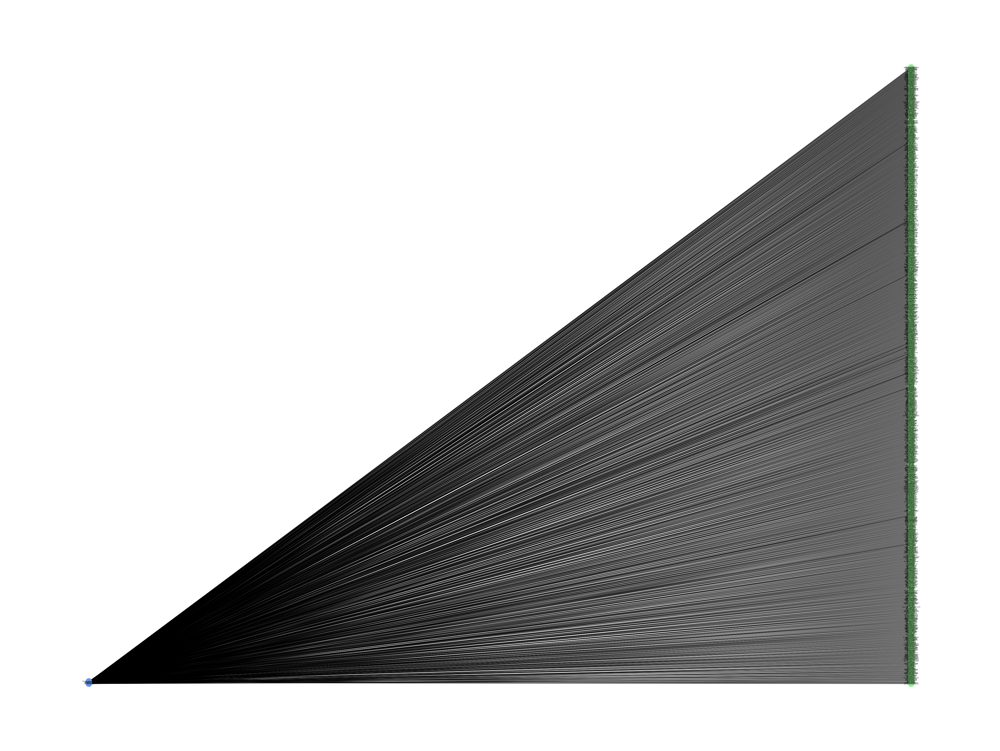

In [36]:
# remove nodes that have NONE bipartite
airline_bipart.remove_nodes_from(bipartite_none)

# separate nodes
top_nodes_subset = {n for n, d in airline_bipart.nodes(data=True) if d['bipartite'] == 0}
bottom_nodes_subset = {n for n, d in airline_bipart.nodes(data=True) if d['bipartite'] == 1}
airline_bipart.nodes(data=True)

# set node colors
color_dict = {0:'cornflowerblue', 1:'lightgreen'}
color_list = [color_dict[i[1]] for i in airline_bipart.nodes.data('bipartite')]

# draw a bipartite graph
pos = dict()
color = []

pos.update((n, (1, i)) for i, n in enumerate(top_nodes_subset))
pos.update((n, (2, i)) for i, n in enumerate(bottom_nodes_subset))

plt.figure(figsize=(40, 30))
nx.draw(airline_bipart, pos=pos, with_labels=True, node_color=color_list, font_size=5, alpha=0.8)
plt.show()

## Centrality Measures

We created unipartite graphs for users and airlines, respectively. We looked at the centrality measures for each variable. We also looked at the connectivity and component community of users and airlines:

### Twitter User Names

In [37]:
random.seed(620)

df = Tweet

# Filter only rows with "Late Flight" as the negative reason
late_flight_df = df[df['negativereason'] == 'Late Flight']

# Create a unipartite graph of users (you can use co-occurrence of airline for linkage)
# For example, if multiple users complain about the same airline, connect them

# Create an edge list: each edge is (user, airline)
edges = list(zip(late_flight_df['name'], late_flight_df['airline']))

# Build a bipartite graph (users and airlines)
B = nx.Graph()
B.add_edges_from(edges)

# Project the graph onto the 'name' nodes to create unipartite user-user graph
users = late_flight_df['name'].unique()
G = nx.bipartite.projected_graph(B, users)

# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# Convert to DataFrame for display
centrality_df = pd.DataFrame({
    'user': list(degree_centrality.keys()),
    'degree': list(degree_centrality.values()),
    'betweenness': list(betweenness_centrality.values()),
    'closeness': list(closeness_centrality.values()),
    'eigenvector': list(eigenvector_centrality.values())
})

# Sort by degree centrality as an example
centrality_df.sort_values(by='degree', ascending=False).head(20)


,user,degree,betweenness,closeness,eigenvector
354,jasemccarty,0.744578,0.394753,0.707735,0.050236
273,_mhertz,0.485141,0.089851,0.595677,0.049685
89,Kwilusz1,0.423293,0.362713,0.628650,0.049489
835,RobVyvey,0.417671,0.008759,0.500693,0.001041
779,ezemanalyst,0.417671,0.008759,0.500693,0.001041
798,georgetietjen,0.417671,0.008759,0.500693,0.001041
812,thebrainlair,0.417671,0.008759,0.500693,0.001041
818,Mwoodshop,0.417671,0.008759,0.500693,0.001041
819,joekamal48,0.417671,0.008759,0.500693,0.001041
762,KingFilson,0.417671,0.008759,0.500693,0.001041


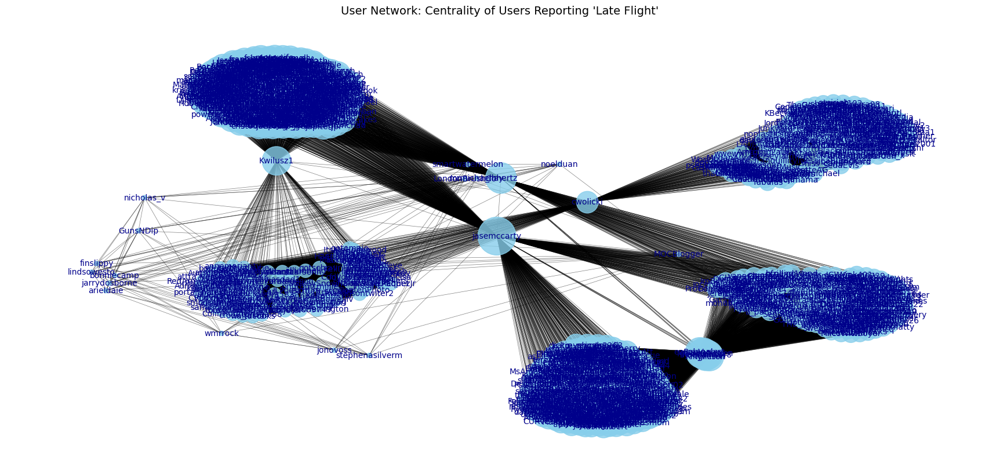

In [38]:
# Set node size based on degree centrality
node_sizes = [v * 3000 for v in nx.degree_centrality(G).values()]

# Set layout
pos = nx.spring_layout(G, k=0.5, seed=42)

# Draw the graph
plt.figure(figsize=(22, 10))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.8)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_color='darkblue')

# Title and display
plt.title("User Network: Centrality of Users Reporting 'Late Flight'", fontsize=14)
plt.axis('off')
plt.show()


# Connected Component and Community

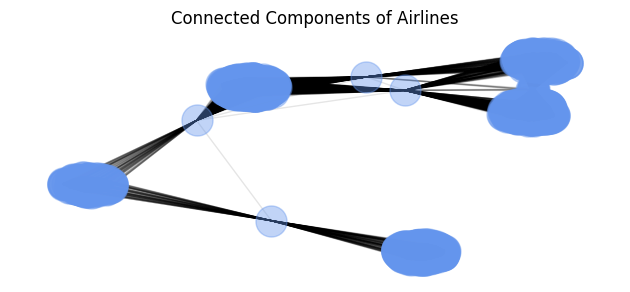

In [39]:
# Ranking of nodes regarding the number of degrees
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)

# Extract connected nodes to visualize
Gcc = G.subgraph(sorted(nx.connected_components(G), key=len, reverse=True)[0])

# Visualization
fig = plt.figure("Degree of the User graph")
axgrid = fig.add_gridspec(5, 4)
ax0 = fig.add_subplot(axgrid[0:3, :])
pos = nx.spring_layout(Gcc, seed=42)
nx.draw_networkx_nodes(Gcc, pos, ax=ax0, node_size=500, alpha=0.4, node_color='cornflowerblue')
nx.draw_networkx_edges(Gcc, pos, ax=ax0, alpha=0.1)
ax0.set_title("Connected Components of Airlines")
ax0.set_axis_off()

fig.tight_layout()
plt.show();

<ipython-input-40-1e5b017896f1>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('gist_ncar', max(partition_user.values()) + 1)


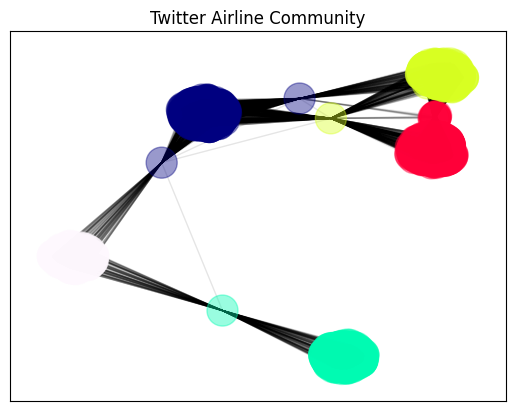

In [40]:
# Community division
partition_user = community_louvain.best_partition(Gcc)

# Color the nodes according to community
cmap = cm.get_cmap('gist_ncar', max(partition_user.values()) + 1)

pos = nx.spring_layout(Gcc, seed=42)
nx.draw_networkx_nodes(Gcc, pos, partition_user.keys(), node_size=500, alpha=0.4,
                       cmap=cmap, node_color=list(partition_user.values()))
nx.draw_networkx_edges(Gcc, pos, alpha=0.1)
plt.title("Twitter Airline Community")
plt.show();

In [41]:
# find the modularity
modularity = nx_comm.modularity(G, nx_comm.label_propagation_communities(G))
print(f'Modularity of Airline network: {modularity}')

Modularity of Airline network: 0.22999596997477528


### Airlines

In [42]:
random.seed(620)


df = Tweet

# Filter only rows with "Late Flight" as the negative reason
late_flight_df = df[df['negativereason'] == 'Late Flight']


# Create an edge list: each edge is (airline, user)
edges = list(zip(late_flight_df['name'], late_flight_df['airline']))

# Build a bipartite graph (users and airlines)
B = nx.Graph()
B.add_edges_from(edges)

users = late_flight_df['airline'].unique()
G = nx.bipartite.projected_graph(B, users)

# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# Convert to DataFrame for display
centrality_df = pd.DataFrame({
    'user': list(degree_centrality.keys()),
    'degree': list(degree_centrality.values()),
    'betweenness': list(betweenness_centrality.values()),
    'closeness': list(closeness_centrality.values()),
    'eigenvector': list(eigenvector_centrality.values())
})

# Sort by degree centrality
centrality_df.sort_values(by='degree', ascending=False).head(20)

,user,degree,betweenness,closeness,eigenvector
1,United,0.6,0.4,0.640000,6.037035e-01
2,Southwest,0.4,0.3,0.533333,3.424874e-01
5,American,0.4,0.0,0.457143,4.971526e-01
4,US Airways,0.4,0.0,0.457143,4.971526e-01
3,Delta,0.2,0.0,0.355556,1.546706e-01
0,Virgin America,0.0,0.0,0.000000,3.225849e-13


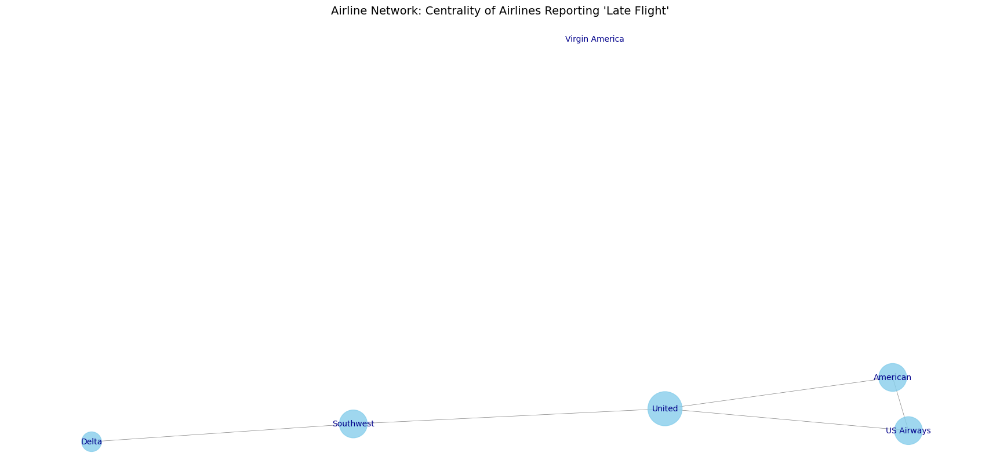

In [43]:
# Set node size based on degree centrality
node_sizes = [v * 3000 for v in nx.degree_centrality(G).values()]

# Set layout
pos = nx.spring_layout(G, k=0.5, seed=42)

# Draw the graph
plt.figure(figsize=(22, 10))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.8)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=10, font_color='darkblue')

# Title and display
plt.title("Airline Network: Centrality of Airlines Reporting 'Late Flight'", fontsize=14)
plt.axis('off')
plt.show()

## Observations & Analysis

We created a bipartite graph using airlines and Twitter users. We subsetted the data to only include users who expressed a negative sentiment of an airline with the reason as 'Late Flight'. Additionally, we created unipartite graphs for users and airlines, evaulating the centrality measures for each. In terms of users, **jasemccarty** had the highest centrality measure in each centrality measure category, which indicates that his posts about late flights are highly influential among other Twitter users who expressed the same reasons. This user has a lot of followers, is connected to other followers that have a lot of followers, is close to his followers and is a bridge to other followers for his followers. **_mhertz** had the 2nd-highest degree and eigenvector centrality measures, but had the 3rd-highest betweenness and closeness centrality measures. This indicates that the user is also influential and has a lot of followers, especially those who are highly influential. However, there was another user who has stronger connections to their followers. That user was **Kwilusz1**, who had the 2nd-highest centrality measures for betweenness and closeness, and 3rd-highest degree and eigenvector centrality measures. Overall, these three users have a high amount of influence among their followers when it comes to expressing their dissatisfaction of late flights for airlines.

When evaulating the centrality measures for airlines, United had the highest degree, betweenness, and closeness centrality measures. This indicates that among Twitter users, United was the airline that was posted about the most when it comes to having 'Late Flight' as its reason. This correlates to the overall amount of users who reacted to the airlines, with United being the airline that users posted about the most. Virgin America did not register any centrality measure, which aligns with the fact that only 3% of users in the dataset overall posted about the airline.